In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [6]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "pancreas_reduced"

threshold = 6

# for the filename
parameters = "2-0_5"

In [7]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

    
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)
    
# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))    

cluster_centers, labels = k_means_pp(k, pca, metric=metric, return_labels=True)
unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 6.608672857284546
My own part is done: 0.46720170974731445
Time for data preperation:  64.31282877922058


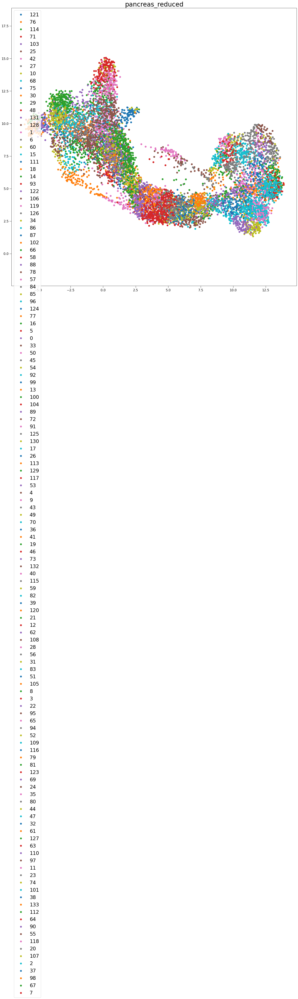

In [8]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [9]:
np.argsort([1,2,36])

0 not in [1,2,3]

True

In [10]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/111 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/37 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/125 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 125 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 64
update Arr 64 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 37
update Arr 37 -> 37


calculating the densities for the density criterion:   0%|          | 0/29 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/95 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 95 -> 85
update Arr 85 -> 76
update Arr 76 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 47
update Arr 47 -> 39
update Arr 39 -> 38
update Arr 38 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 30


calculating the densities for the density criterion:   0%|          | 0/138 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/476 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/476 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/476 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/137 [00:00<?, ?it/s]

update Arr 476 -> 430
update Arr 430 -> 381
update Arr 381 -> 345
update Arr 345 -> 313
update Arr 313 -> 282
update Arr 282 -> 256
update Arr 256 -> 232
update Arr 232 -> 208
update Arr 208 -> 189
update Arr 189 -> 170
update Arr 170 -> 152
update Arr 152 -> 144
update Arr 144 -> 143
update Arr 143 -> 141
update Arr 141 -> 140
update Arr 140 -> 139
update Arr 139 -> 138


calculating the densities for the density criterion:   0%|          | 0/96 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/331 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/331 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/331 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/95 [00:00<?, ?it/s]

update Arr 331 -> 300
update Arr 300 -> 271
update Arr 271 -> 246
added 2 edges early
update Arr 246 -> 223
update Arr 223 -> 202
update Arr 202 -> 183
update Arr 183 -> 165
update Arr 165 -> 148
update Arr 148 -> 134
update Arr 134 -> 120
update Arr 120 -> 108
update Arr 108 -> 102
added 2 edges early
update Arr 102 -> 102
update Arr 102 -> 101
update Arr 101 -> 100
update Arr 100 -> 99
update Arr 99 -> 98
update Arr 98 -> 97
update Arr 97 -> 96


calculating the densities for the density criterion:   0%|          | 0/78 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/247 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/247 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/247 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 247 -> 222
update Arr 222 -> 195
update Arr 195 -> 177
update Arr 177 -> 158
update Arr 158 -> 143
update Arr 143 -> 126
update Arr 126 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 87
update Arr 87 -> 81
update Arr 81 -> 81
update Arr 81 -> 77
added 2 edges early


calculating the densities for the density criterion:   0%|          | 0/122 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/436 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/436 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/436 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/121 [00:00<?, ?it/s]

update Arr 436 -> 390
update Arr 390 -> 347
update Arr 347 -> 315
update Arr 315 -> 286
update Arr 286 -> 258
update Arr 258 -> 233
update Arr 233 -> 210
update Arr 210 -> 187
update Arr 187 -> 167
update Arr 167 -> 151
update Arr 151 -> 136
update Arr 136 -> 131
update Arr 131 -> 131
update Arr 131 -> 129
update Arr 129 -> 128
update Arr 128 -> 127
update Arr 127 -> 126
update Arr 126 -> 125
update Arr 125 -> 123


calculating the densities for the density criterion:   0%|          | 0/144 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/500 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/500 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/500 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/143 [00:00<?, ?it/s]

update Arr 500 -> 452
update Arr 452 -> 409
update Arr 409 -> 371
update Arr 371 -> 337
update Arr 337 -> 305
update Arr 305 -> 276
update Arr 276 -> 249
update Arr 249 -> 226
update Arr 226 -> 205
update Arr 205 -> 186
update Arr 186 -> 169
update Arr 169 -> 153
update Arr 153 -> 152
update Arr 152 -> 151
update Arr 151 -> 150
update Arr 150 -> 148
update Arr 148 -> 145


calculating the densities for the density criterion:   0%|          | 0/60 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/196 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 196 -> 176
update Arr 176 -> 158
update Arr 158 -> 143
update Arr 143 -> 127
update Arr 127 -> 114
update Arr 114 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 75
update Arr 75 -> 64
update Arr 64 -> 64
update Arr 64 -> 63
update Arr 63 -> 60
update Arr 60 -> 60


calculating the densities for the density criterion:   0%|          | 0/39 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/127 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 127 -> 111
update Arr 111 -> 96
update Arr 96 -> 84
update Arr 84 -> 75
update Arr 75 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 46
update Arr 46 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
update Arr 43 -> 40
update Arr 40 -> 40
update Arr 40 -> 39


calculating the densities for the density criterion:   0%|          | 0/57 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/178 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 178 -> 160
update Arr 160 -> 145
update Arr 145 -> 128
update Arr 128 -> 115
update Arr 115 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 75
update Arr 75 -> 67
update Arr 67 -> 66
update Arr 66 -> 65
update Arr 65 -> 61
update Arr 61 -> 61
update Arr 61 -> 58
update Arr 58 -> 58
update Arr 58 -> 57


calculating the densities for the density criterion:   0%|          | 0/114 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/393 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/393 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/393 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/113 [00:00<?, ?it/s]

update Arr 393 -> 357
update Arr 357 -> 320
update Arr 320 -> 281
update Arr 281 -> 254
update Arr 254 -> 230
update Arr 230 -> 207
update Arr 207 -> 188
update Arr 188 -> 170
update Arr 170 -> 154
update Arr 154 -> 139
update Arr 139 -> 125
update Arr 125 -> 121
update Arr 121 -> 120
update Arr 120 -> 119
update Arr 119 -> 117
update Arr 117 -> 116
update Arr 116 -> 115
update Arr 115 -> 114


calculating the densities for the density criterion:   0%|          | 0/80 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/268 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 268 -> 243
update Arr 243 -> 216
update Arr 216 -> 196
update Arr 196 -> 178
update Arr 178 -> 161
update Arr 161 -> 144
update Arr 144 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 94
update Arr 94 -> 87
update Arr 87 -> 86
update Arr 86 -> 85
update Arr 85 -> 83
update Arr 83 -> 82
update Arr 82 -> 80
update Arr 80 -> 80


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/457 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/457 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/457 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 457 -> 405
update Arr 405 -> 368
update Arr 368 -> 329
update Arr 329 -> 299
update Arr 299 -> 271
update Arr 271 -> 245
update Arr 245 -> 221
update Arr 221 -> 199
update Arr 199 -> 179
update Arr 179 -> 162
update Arr 162 -> 146
update Arr 146 -> 133
added 2 edges early
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 131
update Arr 131 -> 130
update Arr 130 -> 127


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/186 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/186 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/186 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 186 -> 161
update Arr 161 -> 146
update Arr 146 -> 132
update Arr 132 -> 119
update Arr 119 -> 107
update Arr 107 -> 95
update Arr 95 -> 85
update Arr 85 -> 72
update Arr 72 -> 65
update Arr 65 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
update Arr 59 -> 57
update Arr 57 -> 57
update Arr 57 -> 56


calculating the densities for the density criterion:   0%|          | 0/134 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/427 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/427 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/427 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/133 [00:00<?, ?it/s]

update Arr 427 -> 381
update Arr 381 -> 346
update Arr 346 -> 314
update Arr 314 -> 284
update Arr 284 -> 257
update Arr 257 -> 233
update Arr 233 -> 211
update Arr 211 -> 190
update Arr 190 -> 171
update Arr 171 -> 154
update Arr 154 -> 142
update Arr 142 -> 142
update Arr 142 -> 140
update Arr 140 -> 137
update Arr 137 -> 137
update Arr 137 -> 136
update Arr 136 -> 135


calculating the densities for the density criterion:   0%|          | 0/80 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/274 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 274 -> 242
update Arr 242 -> 219
update Arr 219 -> 199
update Arr 199 -> 179
update Arr 179 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 87
update Arr 87 -> 86
update Arr 86 -> 84
update Arr 84 -> 82
update Arr 82 -> 81
update Arr 81 -> 79


calculating the densities for the density criterion:   0%|          | 0/25 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/71 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/71 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/71 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 71 -> 61
update Arr 61 -> 52
update Arr 52 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25


calculating the densities for the density criterion:   0%|          | 0/130 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/465 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/465 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/465 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/129 [00:00<?, ?it/s]

update Arr 465 -> 410
update Arr 410 -> 367
update Arr 367 -> 324
update Arr 324 -> 293
update Arr 293 -> 266
update Arr 266 -> 240
update Arr 240 -> 217
update Arr 217 -> 194
update Arr 194 -> 176
update Arr 176 -> 158
update Arr 158 -> 142
update Arr 142 -> 138
update Arr 138 -> 137
update Arr 137 -> 135
update Arr 135 -> 134
update Arr 134 -> 131
update Arr 131 -> 131
update Arr 131 -> 130


calculating the densities for the density criterion:   0%|          | 0/123 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/424 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/424 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/424 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/122 [00:00<?, ?it/s]

update Arr 424 -> 377
added 2 edges early
update Arr 377 -> 338
update Arr 338 -> 304
update Arr 304 -> 276
update Arr 276 -> 249
update Arr 249 -> 225
update Arr 225 -> 202
update Arr 202 -> 183
update Arr 183 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 132
update Arr 132 -> 131
update Arr 131 -> 126
added 3 edges early
update Arr 126 -> 126
update Arr 126 -> 125
update Arr 125 -> 123


calculating the densities for the density criterion:   0%|          | 0/99 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/342 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/342 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/342 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/98 [00:00<?, ?it/s]

update Arr 342 -> 306
update Arr 306 -> 278
update Arr 278 -> 252
update Arr 252 -> 227
update Arr 227 -> 204
update Arr 204 -> 185
update Arr 185 -> 168
update Arr 168 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 111
update Arr 111 -> 108
update Arr 108 -> 107
update Arr 107 -> 104
update Arr 104 -> 104
update Arr 104 -> 102
update Arr 102 -> 101
update Arr 101 -> 100


calculating the densities for the density criterion:   0%|          | 0/99 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/343 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/343 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/343 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/98 [00:00<?, ?it/s]

update Arr 343 -> 308
added 2 edges early
update Arr 308 -> 279
update Arr 279 -> 249
update Arr 249 -> 225
update Arr 225 -> 203
update Arr 203 -> 184
update Arr 184 -> 166
update Arr 166 -> 148
update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 108
update Arr 108 -> 103
update Arr 103 -> 102
update Arr 102 -> 101
update Arr 101 -> 101
update Arr 101 -> 100
update Arr 100 -> 99


calculating the densities for the density criterion:   0%|          | 0/137 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/491 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/491 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/491 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/136 [00:00<?, ?it/s]

update Arr 491 -> 445
update Arr 445 -> 402
added 2 edges early
update Arr 402 -> 360
update Arr 360 -> 327
update Arr 327 -> 296
update Arr 296 -> 268
update Arr 268 -> 243
update Arr 243 -> 219
update Arr 219 -> 198
update Arr 198 -> 179
update Arr 179 -> 162
update Arr 162 -> 146
update Arr 146 -> 145
update Arr 145 -> 144
update Arr 144 -> 143
update Arr 143 -> 140
update Arr 140 -> 139
update Arr 139 -> 137


calculating the densities for the density criterion:   0%|          | 0/32 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/110 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 110 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 38
update Arr 38 -> 34
update Arr 34 -> 33
update Arr 33 -> 31


calculating the densities for the density criterion:   0%|          | 0/78 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/285 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/285 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/285 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 285 -> 252
update Arr 252 -> 226
update Arr 226 -> 204
update Arr 204 -> 183
update Arr 183 -> 166
update Arr 166 -> 150
update Arr 150 -> 134
update Arr 134 -> 120
update Arr 120 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 86
update Arr 86 -> 79
added 2 edges early
update Arr 79 -> 79
update Arr 79 -> 79
update Arr 79 -> 78
update Arr 78 -> 78


calculating the densities for the density criterion:   0%|          | 0/28 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/95 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 95 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
update Arr 29 -> 28


calculating the densities for the density criterion:   0%|          | 0/26 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/94 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 94 -> 83
update Arr 83 -> 73
update Arr 73 -> 55
update Arr 55 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 31
update Arr 31 -> 31
update Arr 31 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
update Arr 28 -> 26


calculating the densities for the density criterion:   0%|          | 0/41 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/123 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 123 -> 108
update Arr 108 -> 96
update Arr 96 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 44
update Arr 44 -> 44
update Arr 44 -> 42
update Arr 42 -> 42


calculating the densities for the density criterion:   0%|          | 0/38 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/123 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 123 -> 109
update Arr 109 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 45
update Arr 45 -> 42
update Arr 42 -> 42
update Arr 42 -> 41
update Arr 41 -> 39
update Arr 39 -> 39


calculating the densities for the density criterion:   0%|          | 0/145 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/511 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/511 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/511 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/144 [00:00<?, ?it/s]

update Arr 511 -> 457
update Arr 457 -> 411
update Arr 411 -> 373
update Arr 373 -> 339
update Arr 339 -> 307
update Arr 307 -> 277
update Arr 277 -> 250
update Arr 250 -> 226
update Arr 226 -> 205
update Arr 205 -> 186
update Arr 186 -> 168
update Arr 168 -> 152
update Arr 152 -> 152
update Arr 152 -> 151
update Arr 151 -> 151
update Arr 151 -> 149
update Arr 149 -> 149
update Arr 149 -> 148
update Arr 148 -> 147
update Arr 147 -> 146
update Arr 146 -> 145


calculating the densities for the density criterion:   0%|          | 0/117 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/406 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/406 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/406 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/116 [00:00<?, ?it/s]

update Arr 406 -> 369
update Arr 369 -> 335
update Arr 335 -> 299
update Arr 299 -> 270
update Arr 270 -> 242
update Arr 242 -> 218
update Arr 218 -> 198
update Arr 198 -> 179
update Arr 179 -> 161
update Arr 161 -> 146
update Arr 146 -> 131
update Arr 131 -> 124
update Arr 124 -> 124
update Arr 124 -> 123
update Arr 123 -> 122
update Arr 122 -> 121
update Arr 121 -> 118
update Arr 118 -> 117
update Arr 117 -> 117


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/451 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/451 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/451 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 451 -> 409
update Arr 409 -> 368
update Arr 368 -> 333
update Arr 333 -> 302
update Arr 302 -> 272
update Arr 272 -> 247
update Arr 247 -> 224
update Arr 224 -> 202
update Arr 202 -> 183
update Arr 183 -> 166
update Arr 166 -> 150
update Arr 150 -> 136
update Arr 136 -> 135
update Arr 135 -> 134
update Arr 134 -> 132
update Arr 132 -> 131
update Arr 131 -> 129
update Arr 129 -> 128


calculating the densities for the density criterion:   0%|          | 0/47 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/153 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 153 -> 136
update Arr 136 -> 118
update Arr 118 -> 106
update Arr 106 -> 96
update Arr 96 -> 87
update Arr 87 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 54
update Arr 54 -> 51
update Arr 51 -> 51
update Arr 51 -> 50
update Arr 50 -> 50
update Arr 50 -> 49
update Arr 49 -> 47


calculating the densities for the density criterion:   0%|          | 0/68 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/228 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 228 -> 207
update Arr 207 -> 188
update Arr 188 -> 170
update Arr 170 -> 153
update Arr 153 -> 137
update Arr 137 -> 123
update Arr 123 -> 110
update Arr 110 -> 99
update Arr 99 -> 88
update Arr 88 -> 77
update Arr 77 -> 75
update Arr 75 -> 74
update Arr 74 -> 73
update Arr 73 -> 70
update Arr 70 -> 70
update Arr 70 -> 69
update Arr 69 -> 68


calculating the densities for the density criterion:   0%|          | 0/43 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/129 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 129 -> 115
update Arr 115 -> 103
update Arr 103 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 67
update Arr 67 -> 59
update Arr 59 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
update Arr 49 -> 47
update Arr 47 -> 45
update Arr 45 -> 43
update Arr 43 -> 42


calculating the densities for the density criterion:   0%|          | 0/85 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/286 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 286 -> 259
update Arr 259 -> 229
update Arr 229 -> 208
update Arr 208 -> 188
update Arr 188 -> 168
update Arr 168 -> 150
update Arr 150 -> 132
update Arr 132 -> 118
update Arr 118 -> 105
update Arr 105 -> 94
update Arr 94 -> 94
update Arr 94 -> 93
update Arr 93 -> 92
update Arr 92 -> 91
update Arr 91 -> 91
update Arr 91 -> 90
update Arr 90 -> 89
update Arr 89 -> 88
update Arr 88 -> 87
update Arr 87 -> 86
update Arr 86 -> 85


calculating the densities for the density criterion:   0%|          | 0/7 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/18 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/18 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/18 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/6 [00:00<?, ?it/s]

update Arr 18 -> 15
update Arr 15 -> 12
update Arr 12 -> 9
update Arr 9 -> 8
update Arr 8 -> 7


calculating the densities for the density criterion:   0%|          | 0/113 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/388 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/388 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/388 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 388 -> 345
update Arr 345 -> 308
update Arr 308 -> 274
update Arr 274 -> 249
update Arr 249 -> 225
update Arr 225 -> 203
update Arr 203 -> 184
update Arr 184 -> 166
update Arr 166 -> 147
update Arr 147 -> 130
update Arr 130 -> 120
added 2 edges early
update Arr 120 -> 120
update Arr 120 -> 118
update Arr 118 -> 117
update Arr 117 -> 115
update Arr 115 -> 114


calculating the densities for the density criterion:   0%|          | 0/73 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/255 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/255 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/255 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 255 -> 230
added 2 edges early
update Arr 230 -> 207
update Arr 207 -> 186
update Arr 186 -> 169
update Arr 169 -> 152
update Arr 152 -> 138
update Arr 138 -> 123
update Arr 123 -> 111
update Arr 111 -> 100
update Arr 100 -> 90
update Arr 90 -> 78
added 2 edges early
update Arr 78 -> 78
update Arr 78 -> 77
update Arr 77 -> 76
update Arr 76 -> 76
update Arr 76 -> 75
update Arr 75 -> 74


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/391 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/391 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/391 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 391 -> 352
update Arr 352 -> 316
update Arr 316 -> 283
update Arr 283 -> 256
update Arr 256 -> 230
update Arr 230 -> 209
update Arr 209 -> 186
update Arr 186 -> 168
update Arr 168 -> 151
update Arr 151 -> 135
update Arr 135 -> 120
update Arr 120 -> 120
update Arr 120 -> 119
update Arr 119 -> 118
update Arr 118 -> 117
update Arr 117 -> 116
update Arr 116 -> 115
update Arr 115 -> 114
update Arr 114 -> 113
update Arr 113 -> 112


calculating the densities for the density criterion:   0%|          | 0/127 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/455 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/455 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/455 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/126 [00:00<?, ?it/s]

update Arr 455 -> 409
update Arr 409 -> 368
update Arr 368 -> 332
update Arr 332 -> 300
update Arr 300 -> 271
update Arr 271 -> 246
update Arr 246 -> 223
update Arr 223 -> 200
update Arr 200 -> 177
update Arr 177 -> 159
update Arr 159 -> 143
update Arr 143 -> 135
update Arr 135 -> 135
update Arr 135 -> 133
update Arr 133 -> 132
update Arr 132 -> 131
update Arr 131 -> 130
update Arr 130 -> 128
update Arr 128 -> 127


calculating the densities for the density criterion:   0%|          | 0/71 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/233 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 233 -> 208
update Arr 208 -> 187
update Arr 187 -> 169
update Arr 169 -> 153
update Arr 153 -> 139
update Arr 139 -> 126
update Arr 126 -> 113
update Arr 113 -> 101
update Arr 101 -> 91
update Arr 91 -> 82
update Arr 82 -> 79
update Arr 79 -> 78
update Arr 78 -> 77
update Arr 77 -> 75
update Arr 75 -> 74
update Arr 74 -> 73
update Arr 73 -> 72
update Arr 72 -> 71


calculating the densities for the density criterion:   0%|          | 0/71 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/250 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 250 -> 223
added 2 edges early
update Arr 223 -> 200
update Arr 200 -> 177
update Arr 177 -> 160
update Arr 160 -> 145
update Arr 145 -> 130
update Arr 130 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 82
update Arr 82 -> 80
update Arr 80 -> 79
update Arr 79 -> 78
update Arr 78 -> 76
update Arr 76 -> 75
update Arr 75 -> 74
update Arr 74 -> 72
update Arr 72 -> 71


calculating the densities for the density criterion:   0%|          | 0/99 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/349 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/349 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/349 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/98 [00:00<?, ?it/s]

update Arr 349 -> 311
update Arr 311 -> 282
update Arr 282 -> 248
update Arr 248 -> 224
update Arr 224 -> 202
update Arr 202 -> 182
update Arr 182 -> 164
update Arr 164 -> 148
update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 105
update Arr 105 -> 104
update Arr 104 -> 103
update Arr 103 -> 102
update Arr 102 -> 101
update Arr 101 -> 100
update Arr 100 -> 99


calculating the densities for the density criterion:   0%|          | 0/116 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/410 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/410 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/410 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/115 [00:00<?, ?it/s]

update Arr 410 -> 356
added 2 edges early
update Arr 356 -> 319
update Arr 319 -> 285
update Arr 285 -> 258
update Arr 258 -> 233
update Arr 233 -> 211
update Arr 211 -> 188
update Arr 188 -> 170
update Arr 170 -> 154
update Arr 154 -> 139
update Arr 139 -> 126
update Arr 126 -> 124
update Arr 124 -> 123
update Arr 123 -> 119
update Arr 119 -> 119
update Arr 119 -> 118
update Arr 118 -> 118
update Arr 118 -> 117
update Arr 117 -> 116


calculating the densities for the density criterion:   0%|          | 0/223 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/804 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/804 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/804 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/222 [00:00<?, ?it/s]

update Arr 804 -> 717
update Arr 717 -> 644
update Arr 644 -> 581
added 3 edges early
update Arr 581 -> 528
update Arr 528 -> 477
update Arr 477 -> 433
update Arr 433 -> 393
update Arr 393 -> 356
update Arr 356 -> 323
update Arr 323 -> 292
update Arr 292 -> 265
update Arr 265 -> 240
update Arr 240 -> 231
update Arr 231 -> 230
update Arr 230 -> 227
update Arr 227 -> 227
update Arr 227 -> 226
update Arr 226 -> 225
update Arr 225 -> 224
update Arr 224 -> 223


calculating the densities for the density criterion:   0%|          | 0/75 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/271 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/271 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/271 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/74 [00:00<?, ?it/s]

update Arr 271 -> 245
update Arr 245 -> 222
update Arr 222 -> 191
update Arr 191 -> 172
update Arr 172 -> 155
update Arr 155 -> 140
update Arr 140 -> 124
update Arr 124 -> 111
update Arr 111 -> 100
update Arr 100 -> 90
update Arr 90 -> 80
update Arr 80 -> 80
update Arr 80 -> 79
update Arr 79 -> 77
update Arr 77 -> 76


calculating the densities for the density criterion:   0%|          | 0/90 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/302 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/302 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/302 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/89 [00:00<?, ?it/s]

update Arr 302 -> 270
update Arr 270 -> 245
update Arr 245 -> 217
update Arr 217 -> 196
update Arr 196 -> 178
update Arr 178 -> 161
update Arr 161 -> 146
update Arr 146 -> 131
update Arr 131 -> 118
update Arr 118 -> 104
update Arr 104 -> 99
update Arr 99 -> 97
update Arr 97 -> 95
update Arr 95 -> 92
update Arr 92 -> 90
update Arr 90 -> 90


calculating the densities for the density criterion:   0%|          | 0/66 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/213 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 213 -> 191
update Arr 191 -> 173
update Arr 173 -> 150
update Arr 150 -> 136
update Arr 136 -> 123
update Arr 123 -> 110
update Arr 110 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 74
update Arr 74 -> 71
update Arr 71 -> 71
update Arr 71 -> 70
update Arr 70 -> 69
update Arr 69 -> 68
update Arr 68 -> 65


calculating the densities for the density criterion:   0%|          | 0/110 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/389 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/389 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/389 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/109 [00:00<?, ?it/s]

update Arr 389 -> 351
added 2 edges early
update Arr 351 -> 310
update Arr 310 -> 281
update Arr 281 -> 255
update Arr 255 -> 230
update Arr 230 -> 208
update Arr 208 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 138
update Arr 138 -> 125
update Arr 125 -> 116
update Arr 116 -> 116
update Arr 116 -> 115
update Arr 115 -> 114
update Arr 114 -> 111
update Arr 111 -> 111
update Arr 111 -> 110


calculating the densities for the density criterion:   0%|          | 0/22 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/68 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/68 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/68 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 45
update Arr 45 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 25
update Arr 25 -> 23
update Arr 23 -> 23
update Arr 23 -> 21


calculating the densities for the density criterion:   0%|          | 0/93 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/332 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/332 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/332 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/92 [00:00<?, ?it/s]

update Arr 332 -> 293
update Arr 293 -> 264
update Arr 264 -> 238
update Arr 238 -> 215
update Arr 215 -> 195
update Arr 195 -> 175
update Arr 175 -> 159
update Arr 159 -> 144
update Arr 144 -> 130
update Arr 130 -> 117
update Arr 117 -> 105
update Arr 105 -> 100
update Arr 100 -> 98
update Arr 98 -> 96
update Arr 96 -> 95
update Arr 95 -> 94
update Arr 94 -> 93


calculating the densities for the density criterion:   0%|          | 0/63 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/221 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/221 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/221 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 221 -> 200
update Arr 200 -> 175
update Arr 175 -> 151
update Arr 151 -> 136
added 2 edges early
update Arr 136 -> 122
update Arr 122 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 70
update Arr 70 -> 68
update Arr 68 -> 67
update Arr 67 -> 65
update Arr 65 -> 65
update Arr 65 -> 64


calculating the densities for the density criterion:   0%|          | 0/151 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/536 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/536 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/536 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/150 [00:00<?, ?it/s]

update Arr 536 -> 483
update Arr 483 -> 436
update Arr 436 -> 382
update Arr 382 -> 347
update Arr 347 -> 315
update Arr 315 -> 286
update Arr 286 -> 259
update Arr 259 -> 235
update Arr 235 -> 213
update Arr 213 -> 193
update Arr 193 -> 175
update Arr 175 -> 160
update Arr 160 -> 159
update Arr 159 -> 158
update Arr 158 -> 156
update Arr 156 -> 155
update Arr 155 -> 154
update Arr 154 -> 153
update Arr 153 -> 151


calculating the densities for the density criterion:   0%|          | 0/42 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/128 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 128 -> 112
update Arr 112 -> 99
update Arr 99 -> 89
update Arr 89 -> 79
update Arr 79 -> 71
update Arr 71 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
update Arr 45 -> 45
update Arr 45 -> 42


calculating the densities for the density criterion:   0%|          | 0/141 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/495 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/495 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/495 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/140 [00:00<?, ?it/s]

update Arr 495 -> 449
update Arr 449 -> 407
update Arr 407 -> 363
update Arr 363 -> 329
update Arr 329 -> 299
update Arr 299 -> 269
update Arr 269 -> 244
update Arr 244 -> 221
update Arr 221 -> 198
update Arr 198 -> 178
update Arr 178 -> 161
update Arr 161 -> 150
update Arr 150 -> 149
update Arr 149 -> 146
update Arr 146 -> 146
update Arr 146 -> 145
update Arr 145 -> 144
update Arr 144 -> 143
update Arr 143 -> 141


calculating the densities for the density criterion:   0%|          | 0/70 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/228 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 228 -> 207
update Arr 207 -> 185
update Arr 185 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 121
update Arr 121 -> 107
update Arr 107 -> 96
update Arr 96 -> 86
update Arr 86 -> 79
update Arr 79 -> 78
update Arr 78 -> 77
update Arr 77 -> 75
update Arr 75 -> 72
update Arr 72 -> 72
update Arr 72 -> 71
update Arr 71 -> 70


calculating the densities for the density criterion:   0%|          | 0/64 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/227 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/227 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/227 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 227 -> 203
update Arr 203 -> 175
update Arr 175 -> 148
update Arr 148 -> 134
update Arr 134 -> 120
update Arr 120 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 78
update Arr 78 -> 73
update Arr 73 -> 69
update Arr 69 -> 69
update Arr 69 -> 69
update Arr 69 -> 68
update Arr 68 -> 67
update Arr 67 -> 66
update Arr 66 -> 65


calculating the densities for the density criterion:   0%|          | 0/173 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/594 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/594 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/594 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/172 [00:00<?, ?it/s]

update Arr 594 -> 534
added 2 edges early
update Arr 534 -> 485
update Arr 485 -> 440
update Arr 440 -> 399
update Arr 399 -> 360
update Arr 360 -> 327
update Arr 327 -> 295
update Arr 295 -> 268
update Arr 268 -> 241
update Arr 241 -> 219
update Arr 219 -> 198
update Arr 198 -> 181
update Arr 181 -> 180
update Arr 180 -> 177
update Arr 177 -> 176
update Arr 176 -> 173
update Arr 173 -> 173


calculating the densities for the density criterion:   0%|          | 0/102 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/354 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/354 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/354 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 354 -> 317
update Arr 317 -> 278
update Arr 278 -> 251
update Arr 251 -> 228
update Arr 228 -> 207
update Arr 207 -> 184
update Arr 184 -> 166
update Arr 166 -> 150
update Arr 150 -> 134
update Arr 134 -> 120
update Arr 120 -> 111
update Arr 111 -> 109
update Arr 109 -> 108
update Arr 108 -> 106
update Arr 106 -> 104
update Arr 104 -> 103
update Arr 103 -> 102


calculating the densities for the density criterion:   0%|          | 0/36 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/112 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 112 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 71
update Arr 71 -> 64
update Arr 64 -> 56
update Arr 56 -> 49
update Arr 49 -> 43
update Arr 43 -> 42
update Arr 42 -> 40
update Arr 40 -> 36
update Arr 36 -> 36
update Arr 36 -> 35


calculating the densities for the density criterion:   0%|          | 0/123 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/428 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/428 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/428 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/122 [00:00<?, ?it/s]

update Arr 428 -> 388
update Arr 388 -> 351
update Arr 351 -> 318
update Arr 318 -> 288
update Arr 288 -> 261
update Arr 261 -> 236
update Arr 236 -> 213
update Arr 213 -> 193
update Arr 193 -> 175
update Arr 175 -> 158
update Arr 158 -> 143
update Arr 143 -> 132
update Arr 132 -> 130
update Arr 130 -> 128
update Arr 128 -> 124


calculating the densities for the density criterion:   0%|          | 0/108 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/366 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/366 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/366 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 366 -> 331
update Arr 331 -> 298
update Arr 298 -> 270
update Arr 270 -> 244
update Arr 244 -> 219
update Arr 219 -> 199
update Arr 199 -> 179
update Arr 179 -> 157
update Arr 157 -> 141
update Arr 141 -> 128
update Arr 128 -> 117
update Arr 117 -> 116
update Arr 116 -> 115
update Arr 115 -> 114
update Arr 114 -> 112
update Arr 112 -> 111
update Arr 111 -> 109


calculating the densities for the density criterion:   0%|          | 0/60 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/197 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 197 -> 178
update Arr 178 -> 158
update Arr 158 -> 139
update Arr 139 -> 126
update Arr 126 -> 113
update Arr 113 -> 102
update Arr 102 -> 91
update Arr 91 -> 81
update Arr 81 -> 71
update Arr 71 -> 68
update Arr 68 -> 65
update Arr 65 -> 61
added 2 edges early
update Arr 61 -> 61
update Arr 61 -> 60


calculating the densities for the density criterion:   0%|          | 0/78 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/262 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/262 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/262 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 262 -> 232
added 2 edges early
update Arr 232 -> 208
update Arr 208 -> 189
update Arr 189 -> 171
update Arr 171 -> 153
update Arr 153 -> 138
update Arr 138 -> 124
update Arr 124 -> 109
update Arr 109 -> 97
update Arr 97 -> 86
update Arr 86 -> 86
update Arr 86 -> 85
update Arr 85 -> 83
update Arr 83 -> 81
update Arr 81 -> 81
update Arr 81 -> 80
update Arr 80 -> 79
update Arr 79 -> 78


calculating the densities for the density criterion:   0%|          | 0/139 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/485 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/485 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/485 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/138 [00:00<?, ?it/s]

update Arr 485 -> 420
update Arr 420 -> 379
added 2 edges early
update Arr 379 -> 336
update Arr 336 -> 305
update Arr 305 -> 276
update Arr 276 -> 250
update Arr 250 -> 227
update Arr 227 -> 206
update Arr 206 -> 185
update Arr 185 -> 167
update Arr 167 -> 146
update Arr 146 -> 146
update Arr 146 -> 145
update Arr 145 -> 144
update Arr 144 -> 142
update Arr 142 -> 138


calculating the densities for the density criterion:   0%|          | 0/139 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/488 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/488 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/488 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/138 [00:00<?, ?it/s]

update Arr 488 -> 429
update Arr 429 -> 389
update Arr 389 -> 343
update Arr 343 -> 311
update Arr 311 -> 282
update Arr 282 -> 255
update Arr 255 -> 230
update Arr 230 -> 208
update Arr 208 -> 189
update Arr 189 -> 167
update Arr 167 -> 151
update Arr 151 -> 148
update Arr 148 -> 147
update Arr 147 -> 145
update Arr 145 -> 144
update Arr 144 -> 140
added 2 edges early
update Arr 140 -> 140
update Arr 140 -> 139


calculating the densities for the density criterion:   0%|          | 0/31 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/105 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 105 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 63
update Arr 63 -> 56
update Arr 56 -> 47
update Arr 47 -> 42
update Arr 42 -> 39
update Arr 39 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 32


calculating the densities for the density criterion:   0%|          | 0/116 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/401 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/401 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/401 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/115 [00:00<?, ?it/s]

update Arr 401 -> 354
update Arr 354 -> 318
update Arr 318 -> 289
update Arr 289 -> 261
update Arr 261 -> 236
update Arr 236 -> 212
update Arr 212 -> 191
update Arr 191 -> 171
update Arr 171 -> 155
update Arr 155 -> 140
update Arr 140 -> 126
update Arr 126 -> 125
update Arr 125 -> 122
update Arr 122 -> 121
update Arr 121 -> 120
update Arr 120 -> 119
update Arr 119 -> 118
update Arr 118 -> 117


calculating the densities for the density criterion:   0%|          | 0/130 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/463 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/463 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/463 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/129 [00:00<?, ?it/s]

update Arr 463 -> 411
update Arr 411 -> 372
added 2 edges early
update Arr 372 -> 325
added 4 edges early
update Arr 325 -> 294
update Arr 294 -> 266
update Arr 266 -> 240
update Arr 240 -> 217
update Arr 217 -> 195
update Arr 195 -> 175
update Arr 175 -> 159
update Arr 159 -> 144
update Arr 144 -> 139
update Arr 139 -> 137
update Arr 137 -> 135
update Arr 135 -> 134
update Arr 134 -> 133
update Arr 133 -> 132
update Arr 132 -> 131


calculating the densities for the density criterion:   0%|          | 0/50 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/168 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 168 -> 148
update Arr 148 -> 134
update Arr 134 -> 120
update Arr 120 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 56
update Arr 56 -> 54
update Arr 54 -> 52
update Arr 52 -> 50
update Arr 50 -> 50


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/439 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/439 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/439 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 439 -> 384
update Arr 384 -> 348
update Arr 348 -> 313
update Arr 313 -> 284
update Arr 284 -> 257
update Arr 257 -> 232
update Arr 232 -> 210
update Arr 210 -> 190
update Arr 190 -> 171
update Arr 171 -> 154
update Arr 154 -> 139
update Arr 139 -> 133
added 2 edges early
update Arr 133 -> 133
update Arr 133 -> 131
update Arr 131 -> 129
update Arr 129 -> 128


calculating the densities for the density criterion:   0%|          | 0/37 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/114 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 114 -> 101
update Arr 101 -> 86
update Arr 86 -> 77
update Arr 77 -> 69
update Arr 69 -> 62
update Arr 62 -> 55
update Arr 55 -> 43
update Arr 43 -> 43
update Arr 43 -> 42
update Arr 42 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
update Arr 38 -> 38


calculating the densities for the density criterion:   0%|          | 0/32 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/104 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 104 -> 90
update Arr 90 -> 81
update Arr 81 -> 72
update Arr 72 -> 65
update Arr 65 -> 57
update Arr 57 -> 50
update Arr 50 -> 44
update Arr 44 -> 37
update Arr 37 -> 36
update Arr 36 -> 35
update Arr 35 -> 33
update Arr 33 -> 32


calculating the densities for the density criterion:   0%|          | 0/238 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/806 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/806 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/806 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/237 [00:00<?, ?it/s]

update Arr 806 -> 717
added 3 edges early
update Arr 717 -> 646
update Arr 646 -> 586
update Arr 586 -> 532
update Arr 532 -> 483
update Arr 483 -> 438
update Arr 438 -> 398
update Arr 398 -> 360
update Arr 360 -> 327
update Arr 327 -> 297
update Arr 297 -> 268
update Arr 268 -> 247
update Arr 247 -> 245
update Arr 245 -> 243
update Arr 243 -> 242
update Arr 242 -> 241
update Arr 241 -> 240
update Arr 240 -> 239


calculating the densities for the density criterion:   0%|          | 0/120 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/397 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/397 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/397 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 397 -> 356
update Arr 356 -> 323
update Arr 323 -> 293
update Arr 293 -> 265
update Arr 265 -> 238
update Arr 238 -> 215
update Arr 215 -> 195
update Arr 195 -> 176
update Arr 176 -> 158
update Arr 158 -> 143
update Arr 143 -> 127
update Arr 127 -> 126
update Arr 126 -> 125
update Arr 125 -> 122
update Arr 122 -> 121
update Arr 121 -> 120


calculating the densities for the density criterion:   0%|          | 0/100 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/352 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/352 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/352 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/99 [00:00<?, ?it/s]

update Arr 352 -> 317
update Arr 317 -> 279
update Arr 279 -> 251
update Arr 251 -> 228
update Arr 228 -> 207
update Arr 207 -> 188
update Arr 188 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 124
update Arr 124 -> 112
update Arr 112 -> 108
update Arr 108 -> 107
update Arr 107 -> 104
update Arr 104 -> 103
update Arr 103 -> 101
update Arr 101 -> 100


calculating the densities for the density criterion:   0%|          | 0/83 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/278 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/278 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/278 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 278 -> 250
update Arr 250 -> 224
update Arr 224 -> 203
update Arr 203 -> 184
update Arr 184 -> 167
update Arr 167 -> 151
update Arr 151 -> 137
update Arr 137 -> 122
update Arr 122 -> 109
update Arr 109 -> 99
update Arr 99 -> 92
update Arr 92 -> 89
update Arr 89 -> 89
update Arr 89 -> 87
update Arr 87 -> 86
update Arr 86 -> 85
update Arr 85 -> 84
update Arr 84 -> 83


calculating the densities for the density criterion:   0%|          | 0/152 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/522 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/522 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/522 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/151 [00:00<?, ?it/s]

update Arr 522 -> 474
update Arr 474 -> 424
update Arr 424 -> 385
update Arr 385 -> 348
update Arr 348 -> 316
update Arr 316 -> 286
update Arr 286 -> 259
update Arr 259 -> 233
update Arr 233 -> 211
update Arr 211 -> 191
update Arr 191 -> 172
update Arr 172 -> 160
update Arr 160 -> 155
added 2 edges early
update Arr 155 -> 155
update Arr 155 -> 154
update Arr 154 -> 153
update Arr 153 -> 152


calculating the densities for the density criterion:   0%|          | 0/114 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/403 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/403 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/403 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/113 [00:00<?, ?it/s]

update Arr 403 -> 364
update Arr 364 -> 330
update Arr 330 -> 298
update Arr 298 -> 270
update Arr 270 -> 244
update Arr 244 -> 221
update Arr 221 -> 199
update Arr 199 -> 179
update Arr 179 -> 161
update Arr 161 -> 146
update Arr 146 -> 132
update Arr 132 -> 122
update Arr 122 -> 122
update Arr 122 -> 121
update Arr 121 -> 118
update Arr 118 -> 117
update Arr 117 -> 114


calculating the densities for the density criterion:   0%|          | 0/164 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/585 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/585 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/585 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/163 [00:00<?, ?it/s]

update Arr 585 -> 528
added 2 edges early
update Arr 528 -> 472
update Arr 472 -> 427
update Arr 427 -> 388
update Arr 388 -> 352
update Arr 352 -> 319
update Arr 319 -> 289
update Arr 289 -> 262
update Arr 262 -> 237
update Arr 237 -> 215
update Arr 215 -> 193
update Arr 193 -> 174
update Arr 174 -> 173
update Arr 173 -> 168
update Arr 168 -> 168
update Arr 168 -> 167
update Arr 167 -> 167
update Arr 167 -> 166
update Arr 166 -> 165


calculating the densities for the density criterion:   0%|          | 0/130 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/469 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/469 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/469 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/129 [00:00<?, ?it/s]

update Arr 469 -> 425
added 2 edges early
update Arr 425 -> 384
update Arr 384 -> 340
update Arr 340 -> 301
update Arr 301 -> 273
update Arr 273 -> 247
update Arr 247 -> 223
update Arr 223 -> 201
update Arr 201 -> 182
update Arr 182 -> 164
update Arr 164 -> 148
update Arr 148 -> 139
update Arr 139 -> 138
update Arr 138 -> 134
update Arr 134 -> 133
update Arr 133 -> 130
added 2 edges early
update Arr 130 -> 130


calculating the densities for the density criterion:   0%|          | 0/75 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/268 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/74 [00:00<?, ?it/s]

update Arr 268 -> 239
update Arr 239 -> 216
update Arr 216 -> 194
update Arr 194 -> 176
update Arr 176 -> 158
update Arr 158 -> 140
update Arr 140 -> 127
update Arr 127 -> 114
update Arr 114 -> 103
update Arr 103 -> 92
update Arr 92 -> 81
added 3 edges early
update Arr 81 -> 81
update Arr 81 -> 80
update Arr 80 -> 79
update Arr 79 -> 79
update Arr 79 -> 78
update Arr 78 -> 74


calculating the densities for the density criterion:   0%|          | 0/68 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/245 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/245 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/245 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 245 -> 208
update Arr 208 -> 185
update Arr 185 -> 168
update Arr 168 -> 152
update Arr 152 -> 138
update Arr 138 -> 124
update Arr 124 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 79
update Arr 79 -> 77
update Arr 77 -> 73
update Arr 73 -> 72
update Arr 72 -> 70
update Arr 70 -> 69


calculating the densities for the density criterion:   0%|          | 0/186 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/652 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/652 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/652 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/185 [00:00<?, ?it/s]

update Arr 652 -> 588
update Arr 588 -> 531
update Arr 531 -> 467
update Arr 467 -> 424
update Arr 424 -> 385
update Arr 385 -> 349
update Arr 349 -> 317
update Arr 317 -> 286
update Arr 286 -> 258
update Arr 258 -> 232
update Arr 232 -> 210
update Arr 210 -> 195
update Arr 195 -> 194
update Arr 194 -> 193
update Arr 193 -> 190
update Arr 190 -> 190
update Arr 190 -> 189
update Arr 189 -> 188
update Arr 188 -> 187
update Arr 187 -> 186


calculating the densities for the density criterion:   0%|          | 0/135 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/480 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/480 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/480 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/134 [00:00<?, ?it/s]

update Arr 480 -> 429
update Arr 429 -> 388
update Arr 388 -> 349
added 3 edges early
update Arr 349 -> 317
update Arr 317 -> 288
update Arr 288 -> 261
update Arr 261 -> 235
update Arr 235 -> 213
update Arr 213 -> 193
update Arr 193 -> 174
update Arr 174 -> 158
update Arr 158 -> 142
added 3 edges early
update Arr 142 -> 142
update Arr 142 -> 141
update Arr 141 -> 141
update Arr 141 -> 139
update Arr 139 -> 138
update Arr 138 -> 137
update Arr 137 -> 136


calculating the densities for the density criterion:   0%|          | 0/155 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/540 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/540 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/540 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/154 [00:00<?, ?it/s]

update Arr 540 -> 487
update Arr 487 -> 441
update Arr 441 -> 399
update Arr 399 -> 362
update Arr 362 -> 328
update Arr 328 -> 297
update Arr 297 -> 268
update Arr 268 -> 241
update Arr 241 -> 217
update Arr 217 -> 197
update Arr 197 -> 179
update Arr 179 -> 163
update Arr 163 -> 163
update Arr 163 -> 162
update Arr 162 -> 162
update Arr 162 -> 161
update Arr 161 -> 160
update Arr 160 -> 158
update Arr 158 -> 157
update Arr 157 -> 156
update Arr 156 -> 155


calculating the densities for the density criterion:   0%|          | 0/131 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/473 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/473 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/473 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/130 [00:00<?, ?it/s]

update Arr 473 -> 429
update Arr 429 -> 389
update Arr 389 -> 347
update Arr 347 -> 313
update Arr 313 -> 283
update Arr 283 -> 257
update Arr 257 -> 232
update Arr 232 -> 208
update Arr 208 -> 188
update Arr 188 -> 170
update Arr 170 -> 154
update Arr 154 -> 140
update Arr 140 -> 139
update Arr 139 -> 138
update Arr 138 -> 133
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 131


calculating the densities for the density criterion:   0%|          | 0/140 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/498 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/498 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/498 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/139 [00:00<?, ?it/s]

update Arr 498 -> 448
update Arr 448 -> 406
update Arr 406 -> 369
update Arr 369 -> 335
update Arr 335 -> 301
update Arr 301 -> 273
update Arr 273 -> 248
update Arr 248 -> 222
update Arr 222 -> 201
update Arr 201 -> 180
update Arr 180 -> 163
update Arr 163 -> 149
update Arr 149 -> 147
update Arr 147 -> 146
update Arr 146 -> 145
update Arr 145 -> 144
update Arr 144 -> 143
update Arr 143 -> 141
update Arr 141 -> 141
update Arr 141 -> 140


calculating the densities for the density criterion:   0%|          | 0/18 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/51 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/51 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/51 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 51 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 18


calculating the densities for the density criterion:   0%|          | 0/120 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/430 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/430 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/430 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 430 -> 379
update Arr 379 -> 342
update Arr 342 -> 306
added 2 edges early
update Arr 306 -> 277
update Arr 277 -> 251
update Arr 251 -> 227
update Arr 227 -> 206
update Arr 206 -> 187
update Arr 187 -> 168
update Arr 168 -> 151
update Arr 151 -> 136
update Arr 136 -> 129
update Arr 129 -> 129
update Arr 129 -> 128
update Arr 128 -> 127
update Arr 127 -> 125
update Arr 125 -> 122
update Arr 122 -> 121
update Arr 121 -> 120


calculating the densities for the density criterion:   0%|          | 0/113 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/388 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/388 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/388 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 388 -> 352
update Arr 352 -> 319
update Arr 319 -> 288
update Arr 288 -> 261
update Arr 261 -> 237
update Arr 237 -> 214
update Arr 214 -> 194
update Arr 194 -> 176
update Arr 176 -> 158
update Arr 158 -> 142
update Arr 142 -> 128
update Arr 128 -> 122
update Arr 122 -> 121
update Arr 121 -> 115
update Arr 115 -> 115
update Arr 115 -> 114
update Arr 114 -> 113
update Arr 113 -> 113


calculating the densities for the density criterion:   0%|          | 0/77 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/264 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/264 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/264 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 264 -> 237
update Arr 237 -> 213
update Arr 213 -> 191
update Arr 191 -> 172
update Arr 172 -> 155
update Arr 155 -> 140
update Arr 140 -> 127
update Arr 127 -> 113
update Arr 113 -> 101
update Arr 101 -> 91
update Arr 91 -> 85
update Arr 85 -> 84
update Arr 84 -> 83
update Arr 83 -> 82
update Arr 82 -> 81
update Arr 81 -> 80
update Arr 80 -> 79
update Arr 79 -> 78
update Arr 78 -> 77


calculating the densities for the density criterion:   0%|          | 0/89 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/326 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/326 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/326 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 326 -> 291
update Arr 291 -> 262
update Arr 262 -> 238
update Arr 238 -> 214
update Arr 214 -> 194
update Arr 194 -> 174
update Arr 174 -> 158
update Arr 158 -> 143
update Arr 143 -> 128
update Arr 128 -> 110
update Arr 110 -> 94
added 3 edges early
update Arr 94 -> 94
update Arr 94 -> 93
update Arr 93 -> 92
update Arr 92 -> 91
update Arr 91 -> 88


calculating the densities for the density criterion:   0%|          | 0/122 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/410 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/410 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/410 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/121 [00:00<?, ?it/s]

update Arr 410 -> 370
update Arr 370 -> 331
added 2 edges early
update Arr 331 -> 299
update Arr 299 -> 271
update Arr 271 -> 246
update Arr 246 -> 223
update Arr 223 -> 201
update Arr 201 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 131
update Arr 131 -> 127
update Arr 127 -> 125
update Arr 125 -> 124
update Arr 124 -> 123
update Arr 123 -> 122


calculating the densities for the density criterion:   0%|          | 0/148 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/515 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/515 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/515 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/147 [00:00<?, ?it/s]

update Arr 515 -> 464
added 2 edges early
update Arr 464 -> 415
update Arr 415 -> 377
update Arr 377 -> 325
update Arr 325 -> 294
update Arr 294 -> 267
update Arr 267 -> 242
update Arr 242 -> 219
update Arr 219 -> 199
update Arr 199 -> 179
update Arr 179 -> 162
update Arr 162 -> 156
update Arr 156 -> 155
update Arr 155 -> 154
update Arr 154 -> 153
update Arr 153 -> 152
update Arr 152 -> 150
update Arr 150 -> 150
update Arr 150 -> 149
update Arr 149 -> 148


calculating the densities for the density criterion:   0%|          | 0/134 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/484 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/484 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/484 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/133 [00:00<?, ?it/s]

update Arr 484 -> 432
update Arr 432 -> 390
update Arr 390 -> 354
update Arr 354 -> 320
update Arr 320 -> 290
update Arr 290 -> 261
update Arr 261 -> 236
update Arr 236 -> 211
update Arr 211 -> 190
update Arr 190 -> 171
update Arr 171 -> 154
update Arr 154 -> 143
update Arr 143 -> 142
update Arr 142 -> 141
update Arr 141 -> 137
update Arr 137 -> 137
update Arr 137 -> 136
update Arr 136 -> 135
update Arr 135 -> 134


calculating the densities for the density criterion:   0%|          | 0/26 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/84 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 84 -> 74
update Arr 74 -> 66
update Arr 66 -> 58
update Arr 58 -> 50
update Arr 50 -> 44
update Arr 44 -> 32
update Arr 32 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
update Arr 26 -> 25


calculating the densities for the density criterion:   0%|          | 0/63 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/219 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/219 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/219 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 219 -> 199
update Arr 199 -> 179
update Arr 179 -> 162
update Arr 162 -> 147
update Arr 147 -> 133
update Arr 133 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 85
update Arr 85 -> 77
update Arr 77 -> 69
added 2 edges early
update Arr 69 -> 69
update Arr 69 -> 67
update Arr 67 -> 66
update Arr 66 -> 63


calculating the densities for the density criterion:   0%|          | 0/74 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/245 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/245 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/245 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/73 [00:00<?, ?it/s]

update Arr 245 -> 221
update Arr 221 -> 193
update Arr 193 -> 172
update Arr 172 -> 156
update Arr 156 -> 141
update Arr 141 -> 127
update Arr 127 -> 115
update Arr 115 -> 104
update Arr 104 -> 92
update Arr 92 -> 83
update Arr 83 -> 81
update Arr 81 -> 79
update Arr 79 -> 78
update Arr 78 -> 76
update Arr 76 -> 75
update Arr 75 -> 73


calculating the densities for the density criterion:   0%|          | 0/55 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/195 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 195 -> 177
update Arr 177 -> 151
update Arr 151 -> 135
update Arr 135 -> 121
update Arr 121 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 63
update Arr 63 -> 62
update Arr 62 -> 59
update Arr 59 -> 58
update Arr 58 -> 58
update Arr 58 -> 56
update Arr 56 -> 55


calculating the densities for the density criterion:   0%|          | 0/83 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/250 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 250 -> 227
update Arr 227 -> 205
update Arr 205 -> 185
update Arr 185 -> 168
update Arr 168 -> 149
update Arr 149 -> 135
update Arr 135 -> 120
update Arr 120 -> 108
update Arr 108 -> 95
update Arr 95 -> 91
update Arr 91 -> 90
update Arr 90 -> 89
update Arr 89 -> 88
update Arr 88 -> 86
update Arr 86 -> 85
update Arr 85 -> 83


calculating the densities for the density criterion:   0%|          | 0/98 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/336 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/336 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/336 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/97 [00:00<?, ?it/s]

update Arr 336 -> 298
update Arr 298 -> 266
update Arr 266 -> 241
update Arr 241 -> 217
update Arr 217 -> 195
update Arr 195 -> 176
update Arr 176 -> 158
update Arr 158 -> 143
update Arr 143 -> 126
update Arr 126 -> 114
update Arr 114 -> 106
update Arr 106 -> 106
update Arr 106 -> 105
update Arr 105 -> 103
update Arr 103 -> 100
update Arr 100 -> 100
update Arr 100 -> 99


calculating the densities for the density criterion:   0%|          | 0/80 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/283 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/283 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/283 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 283 -> 255
added 3 edges early
update Arr 255 -> 220
update Arr 220 -> 199
update Arr 199 -> 180
update Arr 180 -> 162
update Arr 162 -> 146
update Arr 146 -> 131
update Arr 131 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 88
update Arr 88 -> 87
update Arr 87 -> 85
update Arr 85 -> 82
update Arr 82 -> 80
update Arr 80 -> 80


calculating the densities for the density criterion:   0%|          | 0/34 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/103 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 103 -> 92
update Arr 92 -> 81
update Arr 81 -> 73
update Arr 73 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
update Arr 39 -> 36
update Arr 36 -> 35
update Arr 35 -> 34
update Arr 34 -> 34


calculating the densities for the density criterion:   0%|          | 0/38 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/121 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 121 -> 106
update Arr 106 -> 91
update Arr 91 -> 81
update Arr 81 -> 73
update Arr 73 -> 65
update Arr 65 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 47
update Arr 47 -> 46
update Arr 46 -> 46
update Arr 46 -> 43
update Arr 43 -> 42
update Arr 42 -> 41
update Arr 41 -> 40
update Arr 40 -> 39
update Arr 39 -> 38


calculating the densities for the density criterion:   0%|          | 0/129 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/463 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/463 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/463 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/128 [00:00<?, ?it/s]

update Arr 463 -> 414
added 2 edges early
update Arr 414 -> 375
update Arr 375 -> 337
update Arr 337 -> 306
update Arr 306 -> 277
update Arr 277 -> 248
update Arr 248 -> 225
update Arr 225 -> 203
update Arr 203 -> 184
update Arr 184 -> 167
update Arr 167 -> 151
update Arr 151 -> 131
added 5 edges early
update Arr 131 -> 131
update Arr 131 -> 130
update Arr 130 -> 130
update Arr 130 -> 129


calculating the densities for the density criterion:   0%|          | 0/24 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/78 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/78 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/78 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 78 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 28
update Arr 28 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
update Arr 26 -> 25


calculating the densities for the density criterion:   0%|          | 0/61 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/208 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/208 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/208 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 208 -> 188
update Arr 188 -> 168
update Arr 168 -> 152
update Arr 152 -> 137
update Arr 137 -> 124
update Arr 124 -> 110
update Arr 110 -> 99
update Arr 99 -> 89
update Arr 89 -> 79
update Arr 79 -> 70
update Arr 70 -> 68
update Arr 68 -> 66
update Arr 66 -> 62
update Arr 62 -> 62
update Arr 62 -> 60


calculating the densities for the density criterion:   0%|          | 0/104 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/365 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/365 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/365 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/103 [00:00<?, ?it/s]

update Arr 365 -> 330
update Arr 330 -> 299
update Arr 299 -> 258
update Arr 258 -> 234
update Arr 234 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 158
update Arr 158 -> 143
update Arr 143 -> 129
update Arr 129 -> 116
update Arr 116 -> 113
update Arr 113 -> 113
update Arr 113 -> 112
update Arr 112 -> 110
update Arr 110 -> 109
update Arr 109 -> 108
update Arr 108 -> 106
update Arr 106 -> 104


calculating the densities for the density criterion:   0%|          | 0/48 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/158 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 158 -> 139
update Arr 139 -> 122
update Arr 122 -> 110
update Arr 110 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 70
update Arr 70 -> 62
update Arr 62 -> 57
update Arr 57 -> 54
update Arr 54 -> 53
update Arr 53 -> 51
update Arr 51 -> 48
update Arr 48 -> 48
update Arr 48 -> 47


calculating the densities for the density criterion:   0%|          | 0/85 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/286 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 286 -> 255
update Arr 255 -> 228
update Arr 228 -> 203
update Arr 203 -> 184
update Arr 184 -> 167
update Arr 167 -> 150
update Arr 150 -> 135
update Arr 135 -> 121
update Arr 121 -> 109
update Arr 109 -> 99
update Arr 99 -> 94
update Arr 94 -> 92
update Arr 92 -> 89
update Arr 89 -> 87
update Arr 87 -> 87
update Arr 87 -> 86
update Arr 86 -> 85


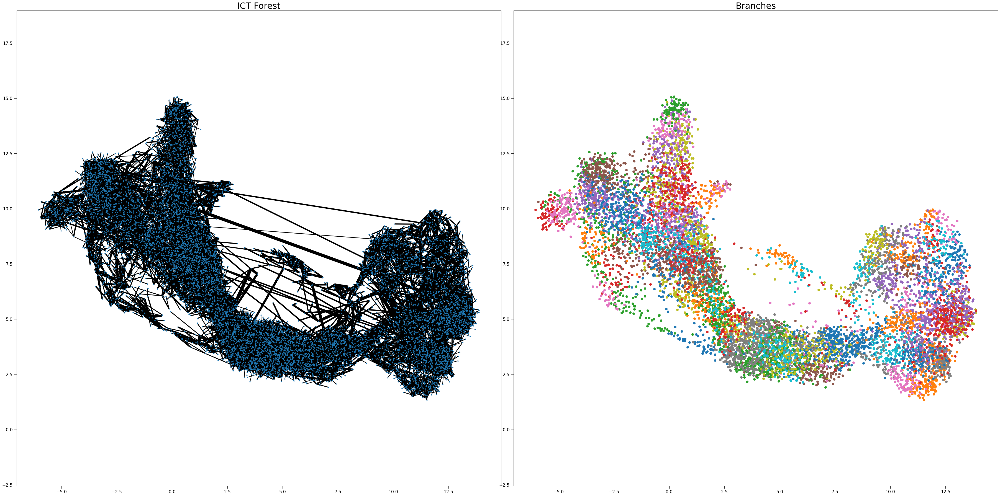

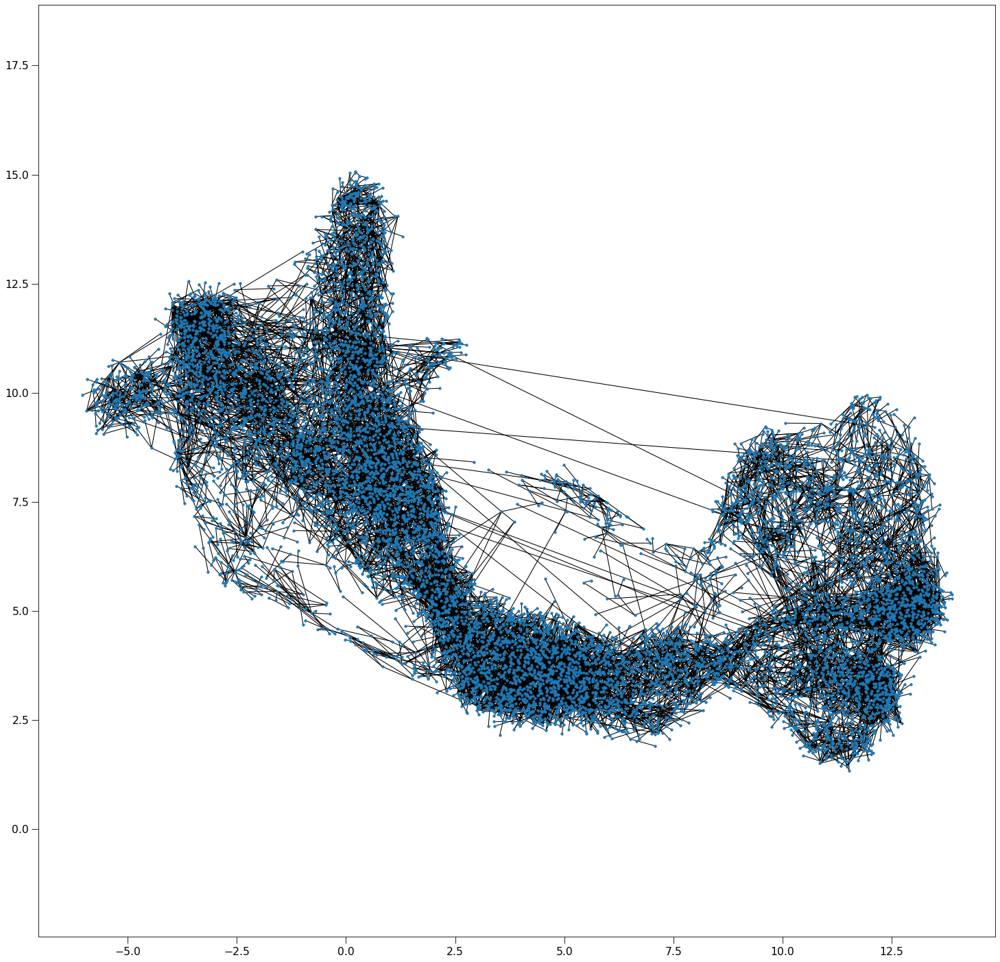

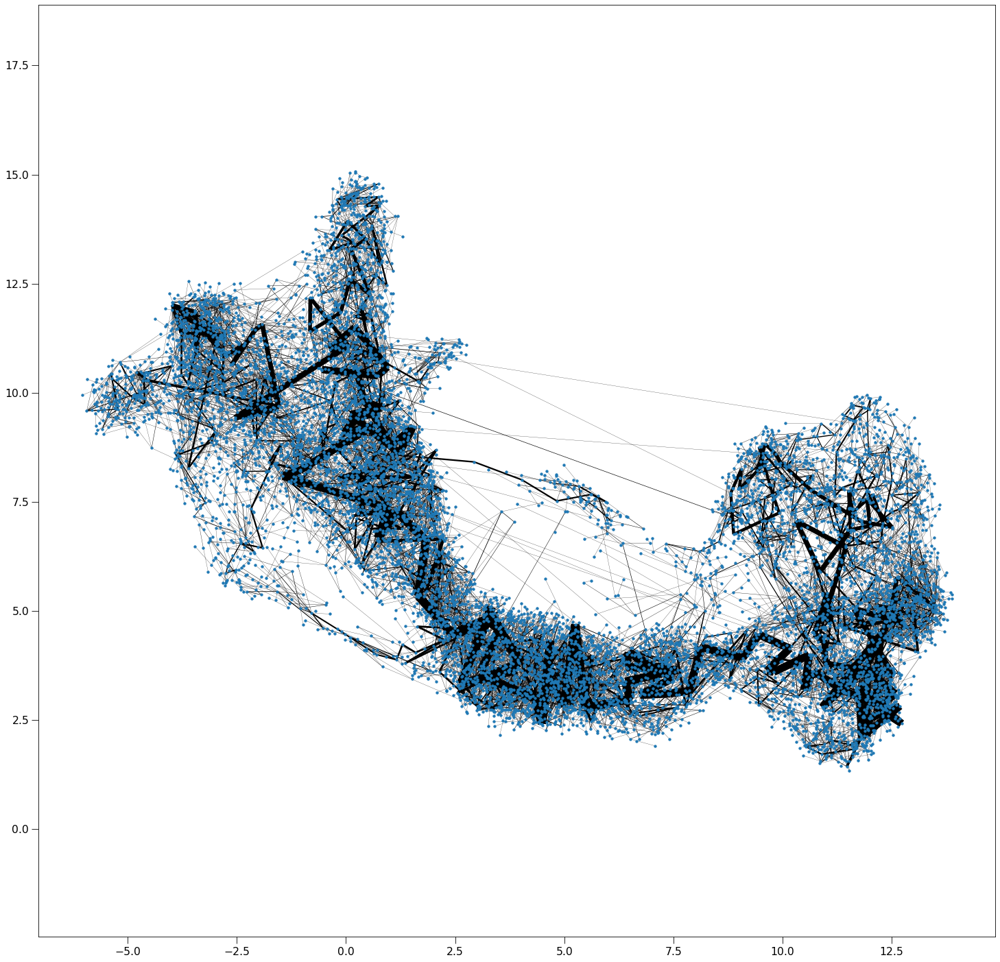

In [11]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, pca)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [12]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()

create edgeId array:   0%|          | 0/10175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/10175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/10175 [00:00<?, ?it/s]

update Arr 10175 -> 10175
added 6456 edges early
added 3718 edges early


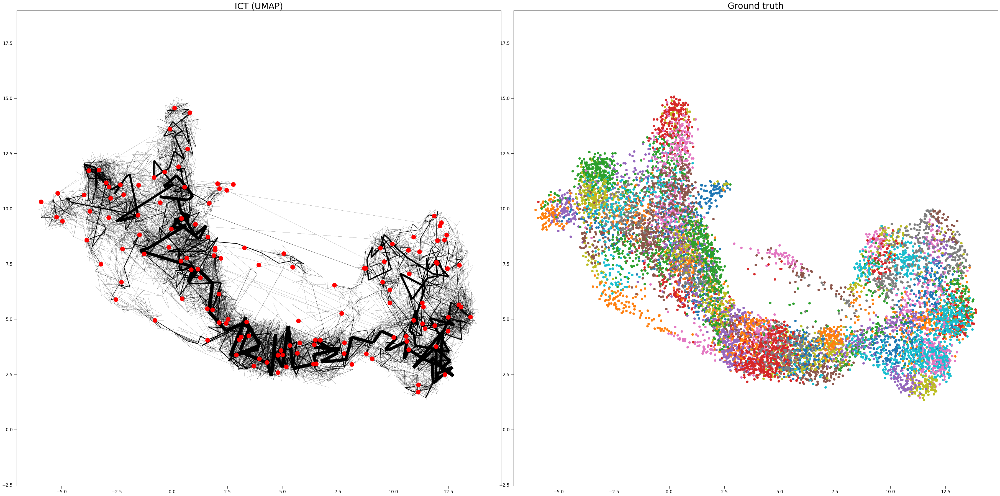

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

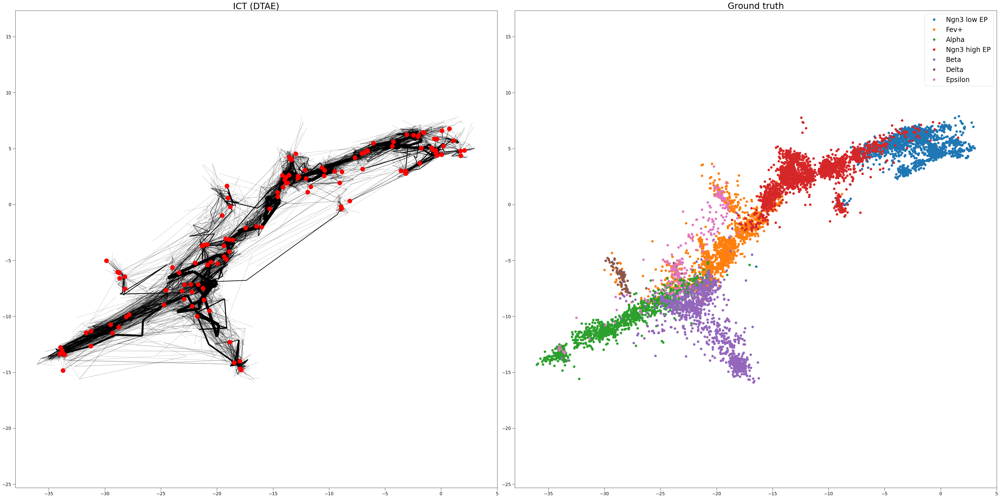

In [14]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

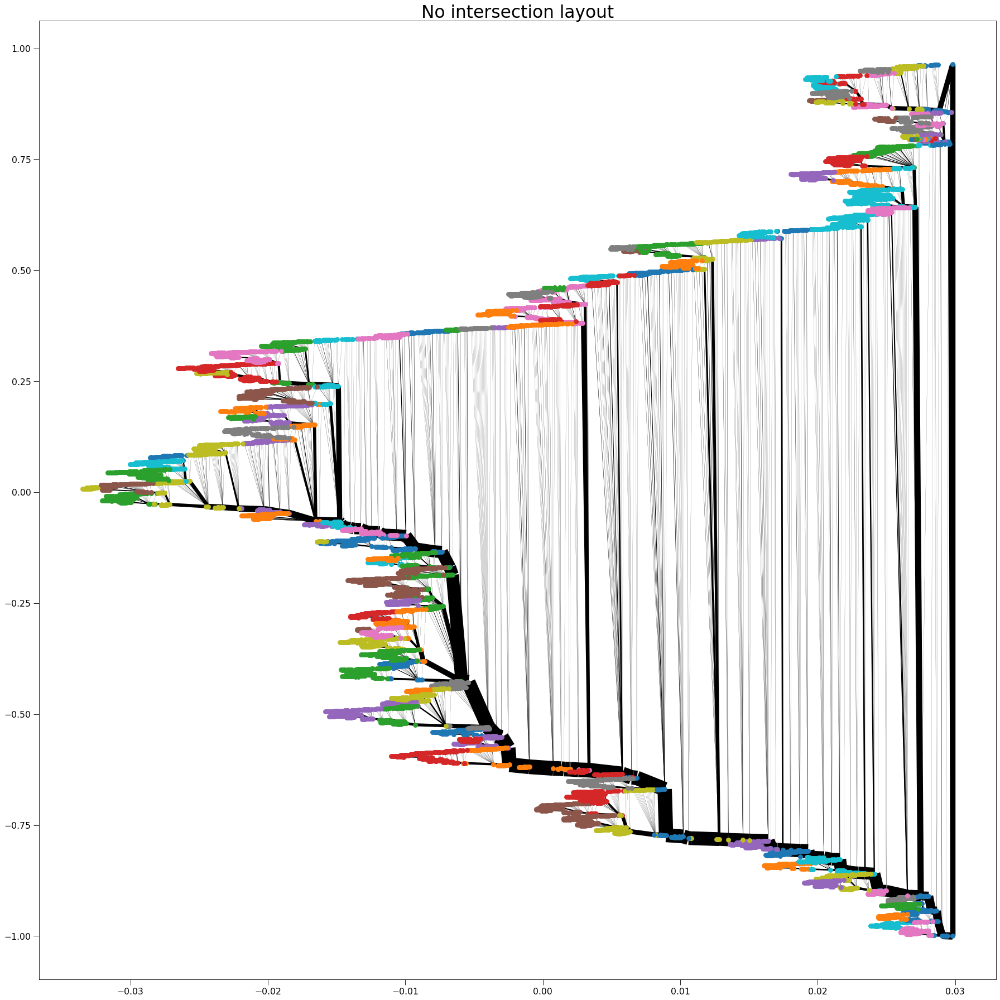

In [15]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()